In [4]:
from pathlib import Path
import matplotlib.pyplot as plt
from nucleo.io.plots_2D import plot_all_heatmaps

root = Path("/home/nicolas/Documents/Workspace/nucleo/outputs/NUCLEO__PSMN__2026-07-09/")

fig1, axes1 = plot_all_heatmaps(
    speed_cols=["v_mean", "vf", "wf"],
    root=root,
    type_of_data="norm_th",
    plot_log2=True,
)
fig1.savefig("/tmp/fig1.png", dpi=150, bbox_inches="tight")

Plotting heatmaps: 100%|██████████| 20/20 [00:01<00:00, 13.81it/s]


Scanning 178200 parquet files...
Scanning 178200 parquet files...
Scanning 178200 parquet files...
Scanning 178200 parquet files...
Scanning 178200 parquet files...
Scanning 178200 parquet files...
Scanning 178200 parquet files...
Scanning 178200 parquet files...
Scanning 178200 parquet files...
Scanning 178200 parquet files...
Scanning 178200 parquet files...
Scanning 178200 parquet files...
Scanning 178200 parquet files...
Scanning 178200 parquet files...
Scanning 178200 parquet files...
Scanning 178200 parquet files...
Scanning 178200 parquet files...
Scanning 178200 parquet files...
Scanning 178200 parquet files...
Scanning 178200 parquet files...


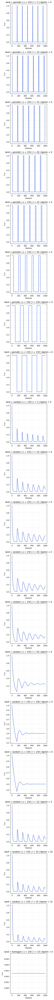

In [5]:
from nucleo.io.reading import finding_one_parquet
import polars as pl
import numpy as np
import matplotlib.pyplot as plt

root = "/home/nicolas/Documents/Workspace/nucleo/outputs/NUCLEO__PSMN__2026-07-09"
root_config = f"{root}/scenarios.json"
df_config = pl.read_json(root_config)

params_fixed_2 = {
    "algo": "1S", "fact": False, "mode": "none", "dstr": False,
    "s": 150, "mu": 160, "theta": 20,
    "alphar": 0.00, "Kp": 0.00, "Kz": 0.00,
}

n_rows = df_config.height
fig, axes = plt.subplots(ncols=1, nrows=n_rows, figsize=(4, 4 * n_rows), squeeze=False)

for i, row in enumerate(df_config.iter_rows()):
    land = row[3]
    s = row[0]
    l = row[1]
    bpmin = row[2]
    title_base = f"land = {land} | s = {s} | l = {l} | bpmin = {bpmin}"

    # --- Une seule lecture parquet pour la ligne ---
    params_row_2 = {**params_fixed_2, "land": land, "l": l, "bpmin": bpmin}
    df_plot_2 = finding_one_parquet(root=root, params=params_row_2)

    l_view_to_plot = df_plot_2["l_view"][0].to_numpy()
    tbj_points = df_plot_2["tbj_points"][0].to_numpy()
    tbj_distrib = df_plot_2["tbj_distrib"][0].to_numpy()

    # --- Colonne 1 : l_view ---
    ax1 = axes[i, 0]
    ax1.plot(l_view_to_plot, c="royalblue")
    ax1.set_title(title_base)
    ax1.set_xlabel("Position")
    ax1.set_ylabel(r"$l_{view}$")
    ax1.grid(True, which="both", alpha=0.30)

    # # --- Colonne 2 : tbj_points / tbj_distrib ---
    # ax2 = axes[i, 1]
    # ax2.plot(tbj_points, tbj_distrib, color="cyan")
    # ax2.set_title(title_base)
    # ax2.set_xlabel("Waiting Time")
    # ax2.set_ylabel("Distribution")
    # ax2.set_ylim([5e-6, 5e0])
    # ax2.grid(True, which="both", alpha=0.30)
    # ax2.set_xscale("log")
    # ax2.set_yscale("log")

plt.tight_layout()
fig.savefig("/tmp/fig2.png", dpi=150, bbox_inches="tight")

In [6]:
from PIL import Image

img1 = Image.open("/tmp/fig1.png")
img2 = Image.open("/tmp/fig2.png")

w = img1.width + img2.width
h = max(img1.height, img2.height)
combined = Image.new("RGB", (w, h), "white")
combined.paste(img1, (0, 0))
combined.paste(img2, (img1.width, 0))

combined.save("/tmp/combined.png")

===== bpmin =====


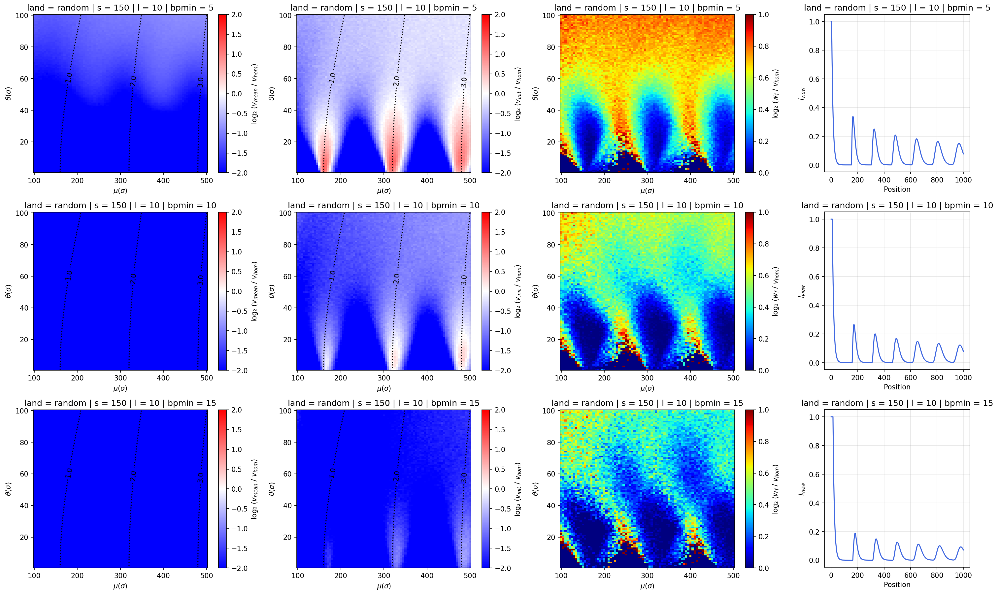

===== random =====


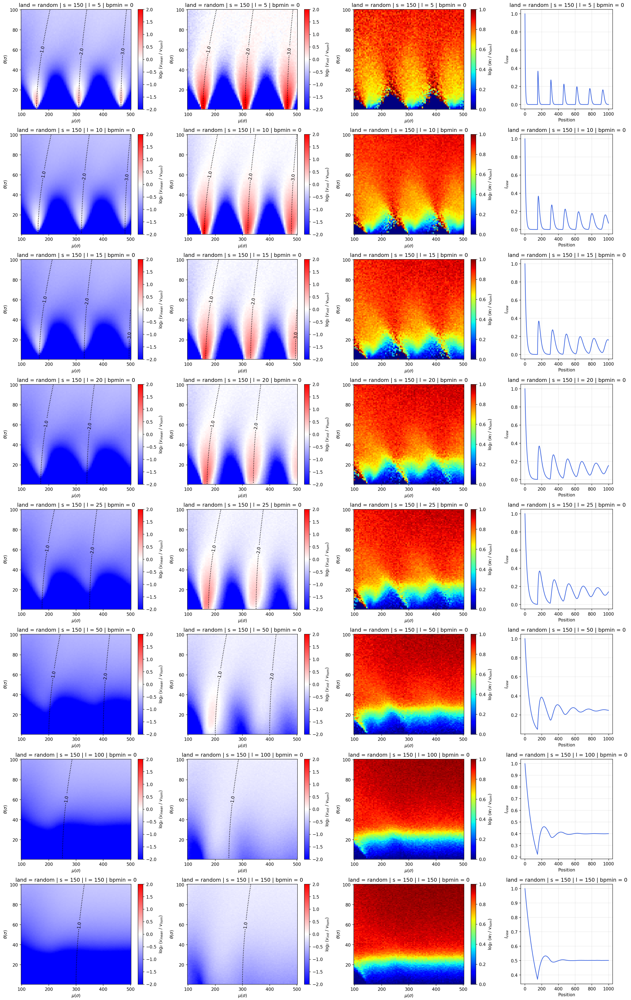

===== periodic =====


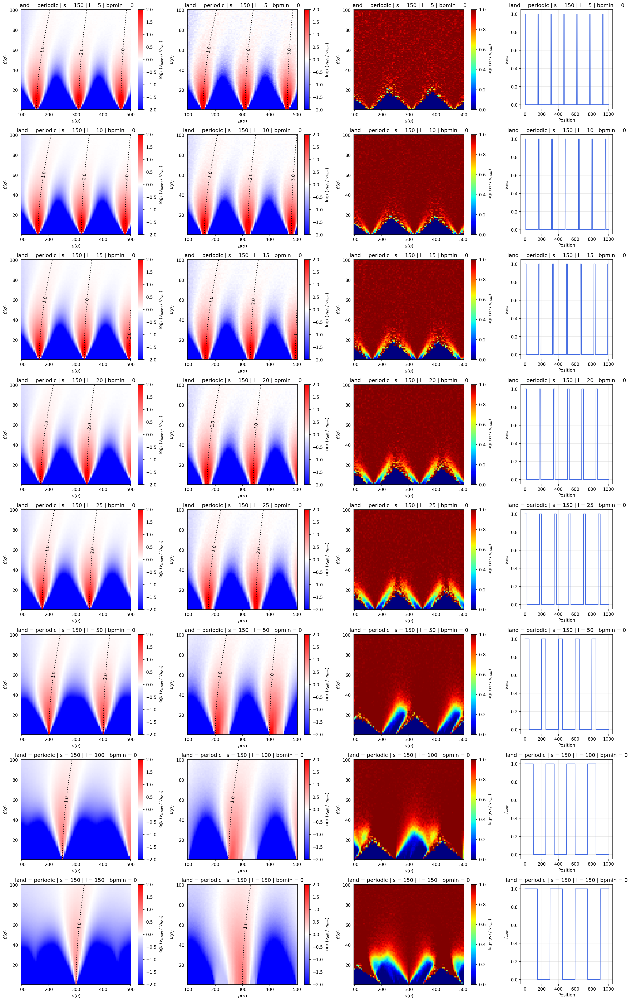

===== homogeneous =====


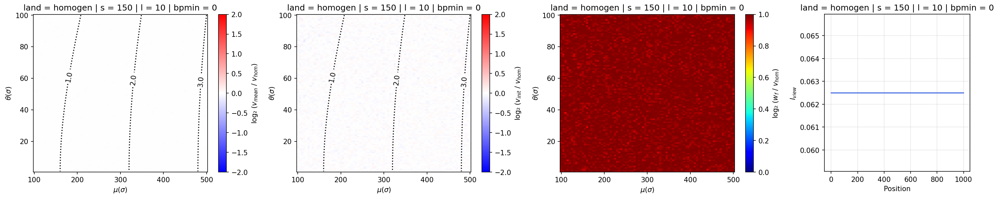

In [7]:
from PIL import Image
from collections import defaultdict

n_rows = df_config.height
row_height = combined.height // n_rows

# Découpe des lignes
row_crops = []
for i in range(n_rows):
    top = i * row_height
    bottom = combined.height if i == n_rows - 1 else (i + 1) * row_height
    row_crops.append(combined.crop((0, top, combined.width, bottom)))


# Attribution des groupes
groups = {
    "bpmin": [],
    "random": [],
    "periodic": [],
    "homogeneous": []
}

for i, row in enumerate(df_config.iter_rows(named=True)):
    if row["land"] == "random" and row["bpmin"] != 0:
        groups["bpmin"].append(row_crops[i])

    elif row["land"] == "random" and row["bpmin"] == 0:
        groups["random"].append(row_crops[i])

    elif row["land"] == "periodic":
        groups["periodic"].append(row_crops[i])

    elif row["land"] == "homogen":
        groups["homogeneous"].append(row_crops[i])


# Fonction pour empiler les subfigures
def merge_vertical(images):
    width = max(img.width for img in images)
    height = sum(img.height for img in images)

    merged = Image.new("RGB", (width, height), "white")

    y = 0
    for img in images:
        merged.paste(img, (0, y))
        y += img.height

    return merged


# Création des figures finales
final_figures = {}

for name, crops in groups.items():
    if crops:
        final_figures[name] = merge_vertical(crops)
        final_figures[name].save(f"/tmp/{name}.png")

        print(f"===== {name} =====")
        display(final_figures[name])
        final_figures[name].save(f"supfig1_{name}_final.png")

# .